In [1]:
import pandas as pd
import numpy as np
import os
from matplotlib import pyplot as plt
plt.rcParams["figure.figsize"] = (12,12)

In [2]:
filename = 'P:/CoxaAI/preprocess_data/csv_detection_info/EE.csv'
filename_clean = 'P:/CoxaAI/preprocess_data/csv_detection_info_clean/EE.csv'
saved_cropped_image = 'P:/CoxaAI/preprocess_data/cropped/EE'

In [3]:
detection_df = pd.read_csv(filename)

In [4]:
detection_df

,base_path,filename,parent_name,crop_name,ax0_min,ax0_max,ax1_min,ax1_max,confidence,is_rotated,diagnosis,diagnosis_raw
0,P:/CoxaAI/Sortering 1/EE,1.3.51.0.7.11779273936.56926.37446.34587.43056...,1-22001308,1.3.51.0.7.11779273936.56926.37446.34587.43056...,2022,2190,1347,1482,0.783292,False,4,EE
1,P:/CoxaAI/Sortering 1/EE,1.3.51.0.7.11779273936.56926.37446.34587.43056...,1-22001308,1.3.51.0.7.11779273936.56926.37446.34587.43056...,2029,2184,2173,2299,0.697642,False,4,EE
2,P:/CoxaAI/Sortering 1/EE,1.2.276.0.95.31933.1.20220119.172502.0.2.20342...,1-22001845,1.2.276.0.95.31933.1.20220119.172502.0.2.20342...,588,760,797,922,0.913807,False,4,EE
3,P:/CoxaAI/Sortering 1/EE,1.2.276.0.95.31933.1.20220119.172502.0.2.20342...,1-22001845,1.2.276.0.95.31933.1.20220119.172502.0.2.20342...,591,771,1430,1568,0.831446,False,4,EE
4,P:/CoxaAI/Sortering 1/EE,1.2.276.0.95.33739.20220223.145121.0.dcm,1-22002652,1.2.276.0.95.33739.20220223.145121.0.dcm_h1,588,760,797,922,0.000000,True,4,EE
...,...,...,...,...,...,...,...,...,...,...,...,...
215,P:/CoxaAI/Sortering 1/EE,1.3.51.0.7.12881292634.48832.29515.46691.11948...,1-23053563,1.3.51.0.7.12881292634.48832.29515.46691.11948...,998,1279,2310,2524,0.919089,False,4,EE
216,P:/CoxaAI/Sortering 1/EE,1.2.276.0.95.33458.1.20230616.84523.0.2.12239.dcm,1-23055006,1.2.276.0.95.33458.1.20230616.84523.0.2.12239....,1176,1311,1130,1233,0.995705,False,4,EE
217,P:/CoxaAI/Sortering 1/EE,1.2.276.0.95.33458.1.20230616.84523.0.2.12239.dcm,1-23055006,1.2.276.0.95.33458.1.20230616.84523.0.2.12239....,1207,1339,1713,1817,0.947854,False,4,EE
218,P:/CoxaAI/Sortering 1/EE,1.2.276.0.95.33458.1.20230616.84811.0.2.12242.dcm,1-23055006,1.2.276.0.95.33458.1.20230616.84811.0.2.12242....,1153,1292,1153,1254,0.978451,False,4,EE


### [Optional] Sort by confidence (filter out bad prediction)

In [5]:
# detection_df = detection_df[detection_df.confidence > 0.5]

In [6]:
detection_df[detection_df.confidence < 0.5].index

Int64Index([  4,   5,   6,   7,  17,  34,  35,  36,  37,  39,  41,  47,  48,
             49, 100, 101, 139, 178, 179, 180, 181, 211],
           dtype='int64')

Note that there many cases that are not good

### Look at the crop images

Are they reasonable, if not, mark the "weird", "wrong detected" image indice before saving it back to the clean folder

In [7]:
# plot every 9 of them

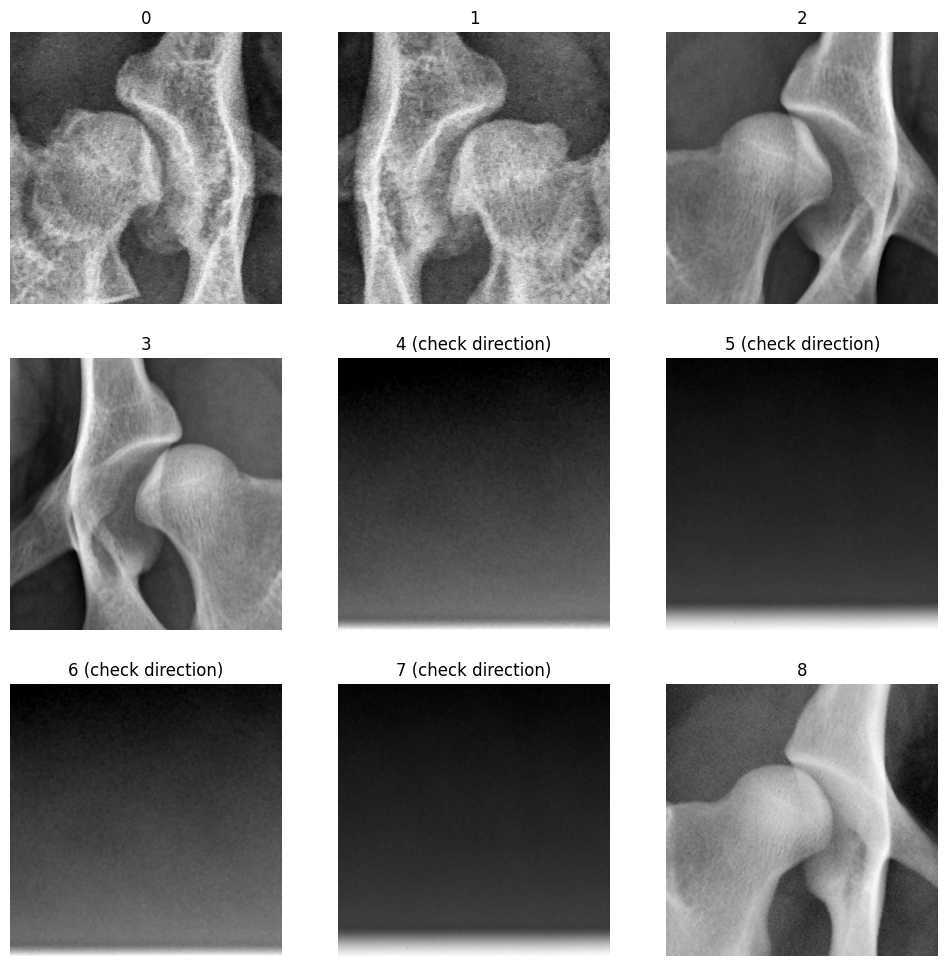

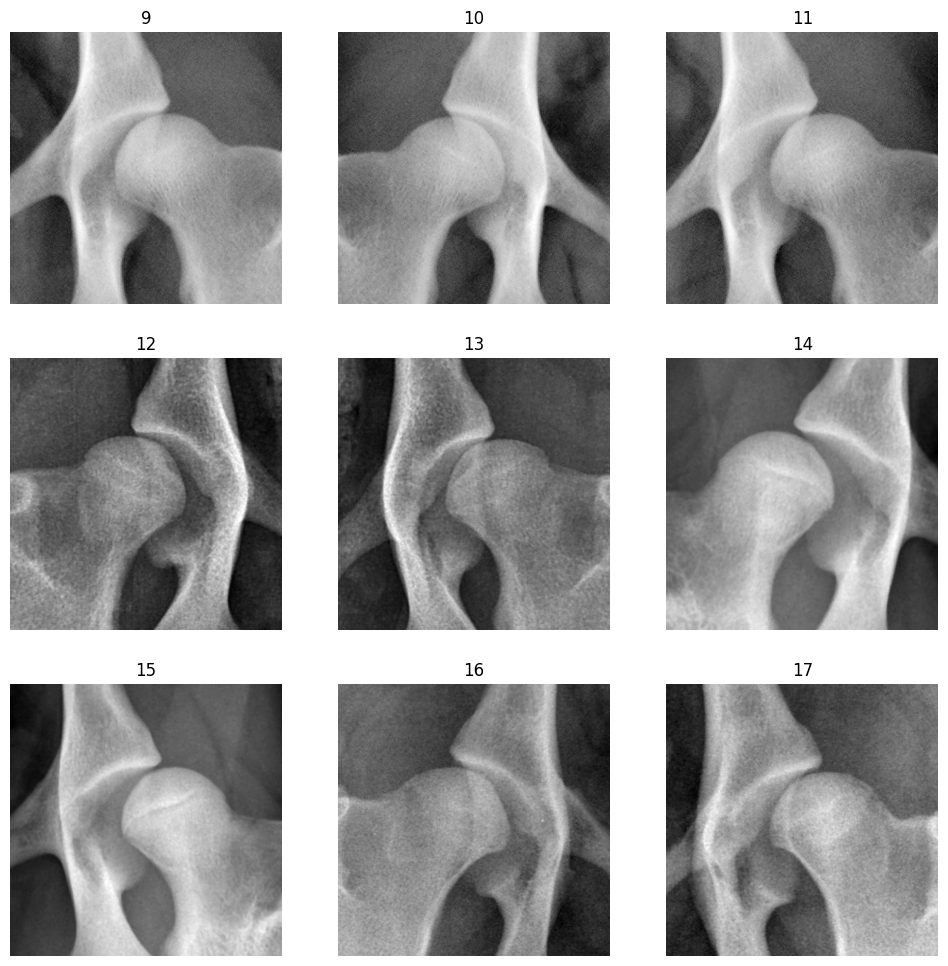

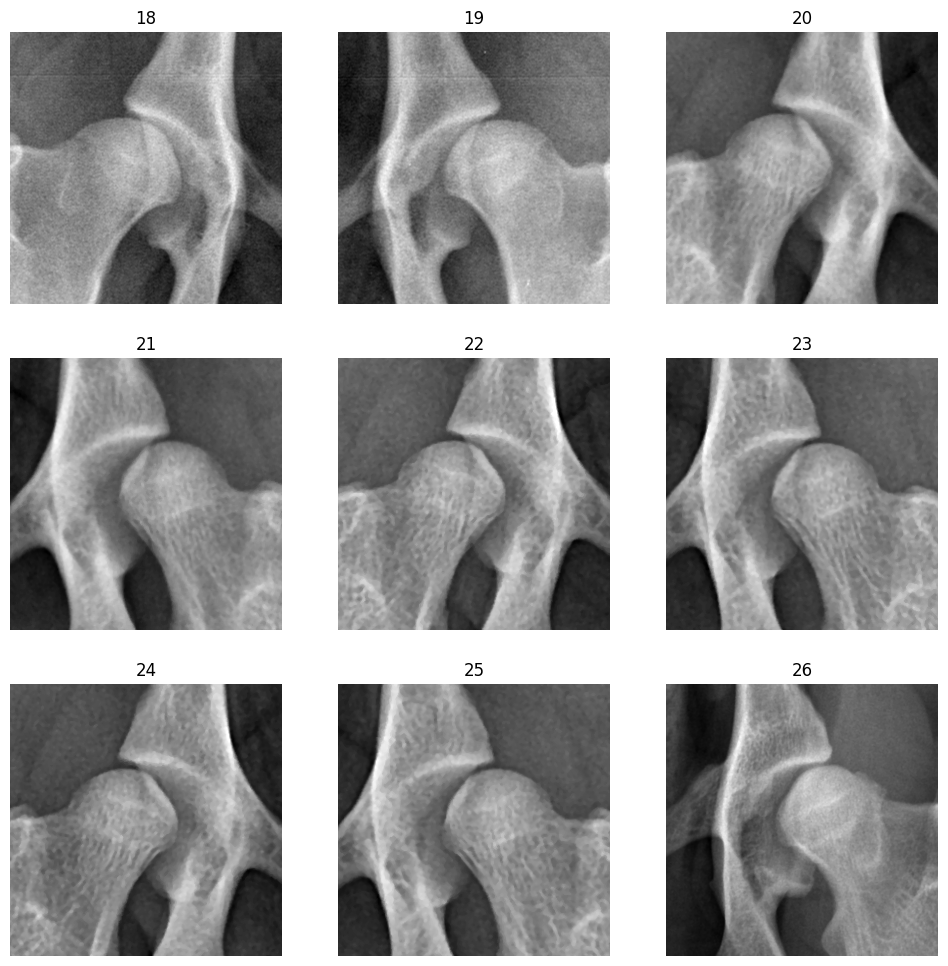

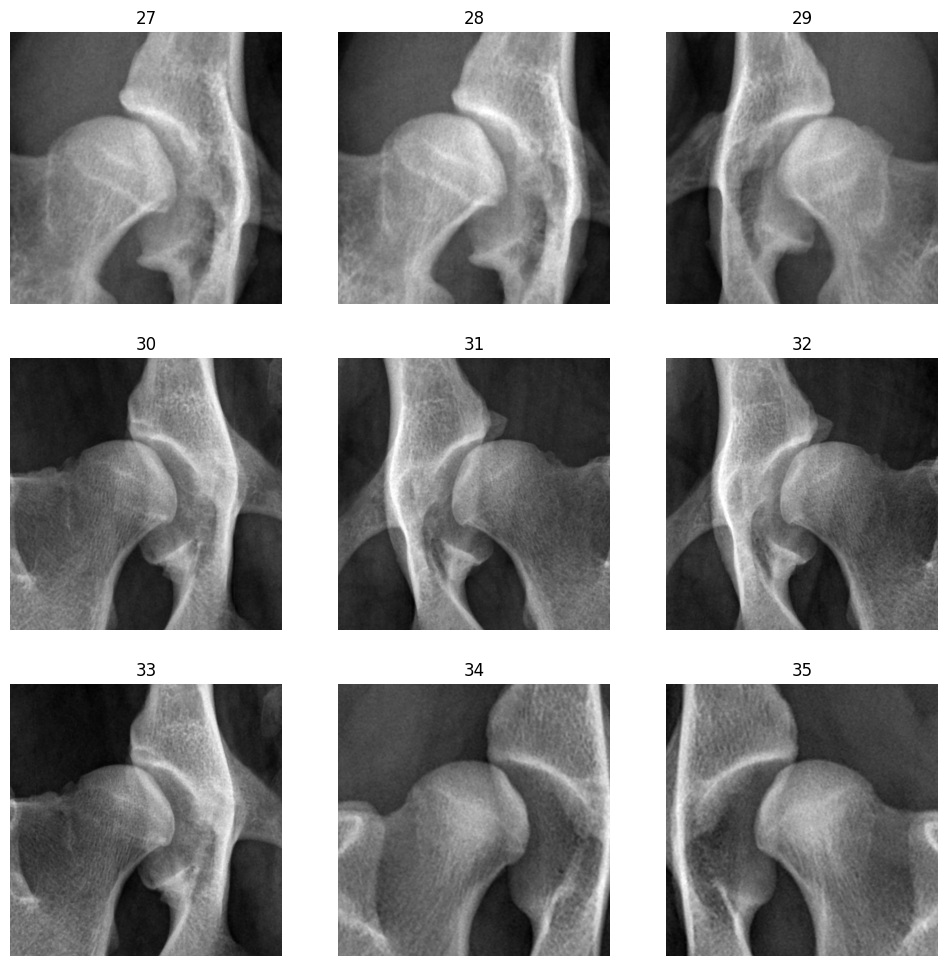

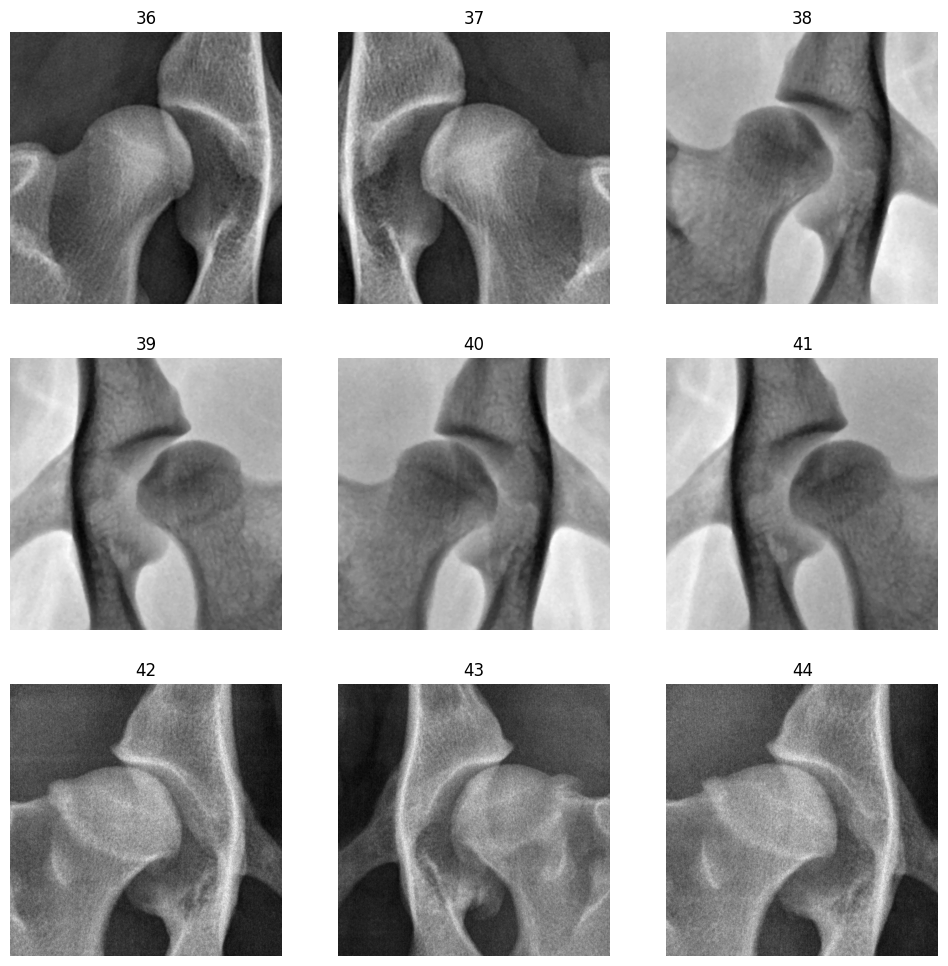

...

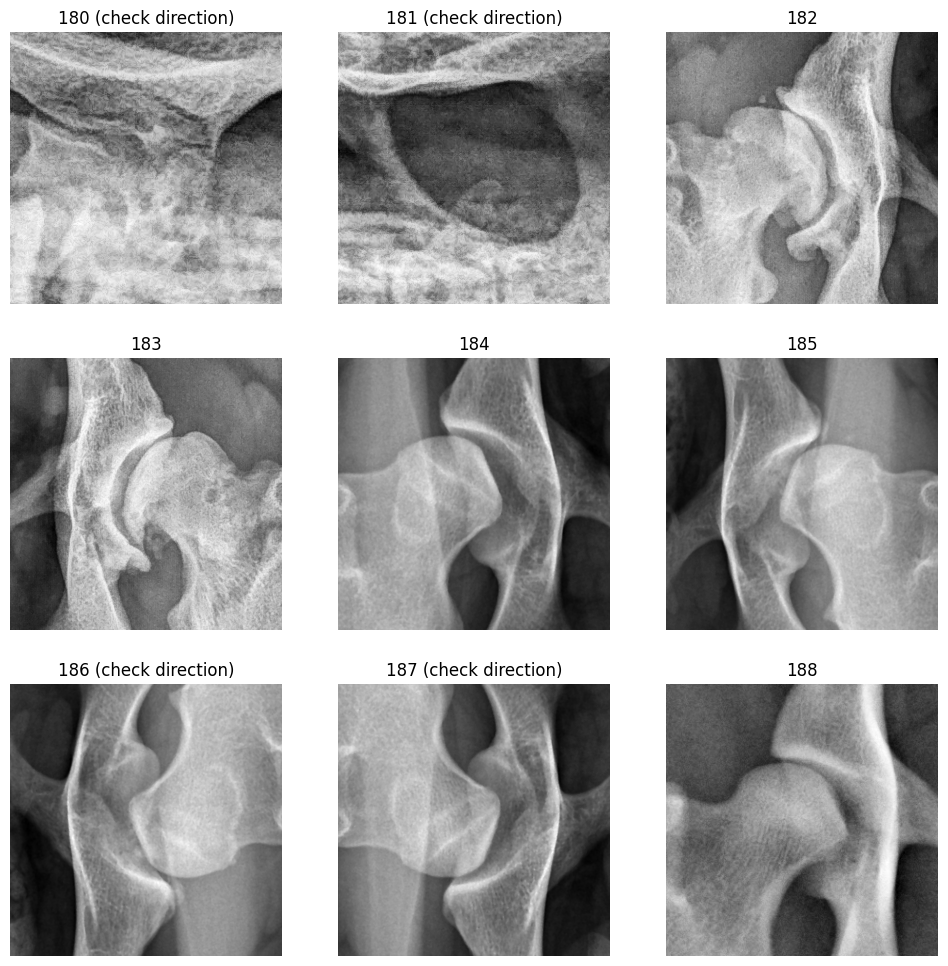

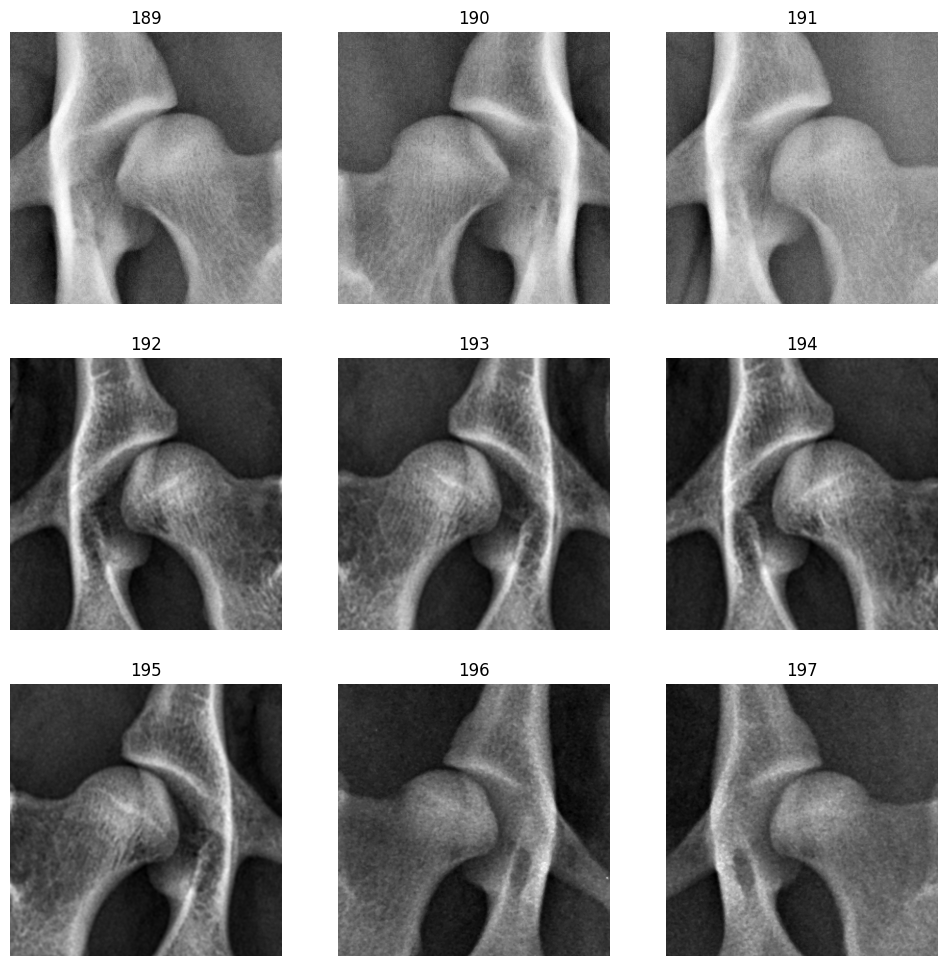

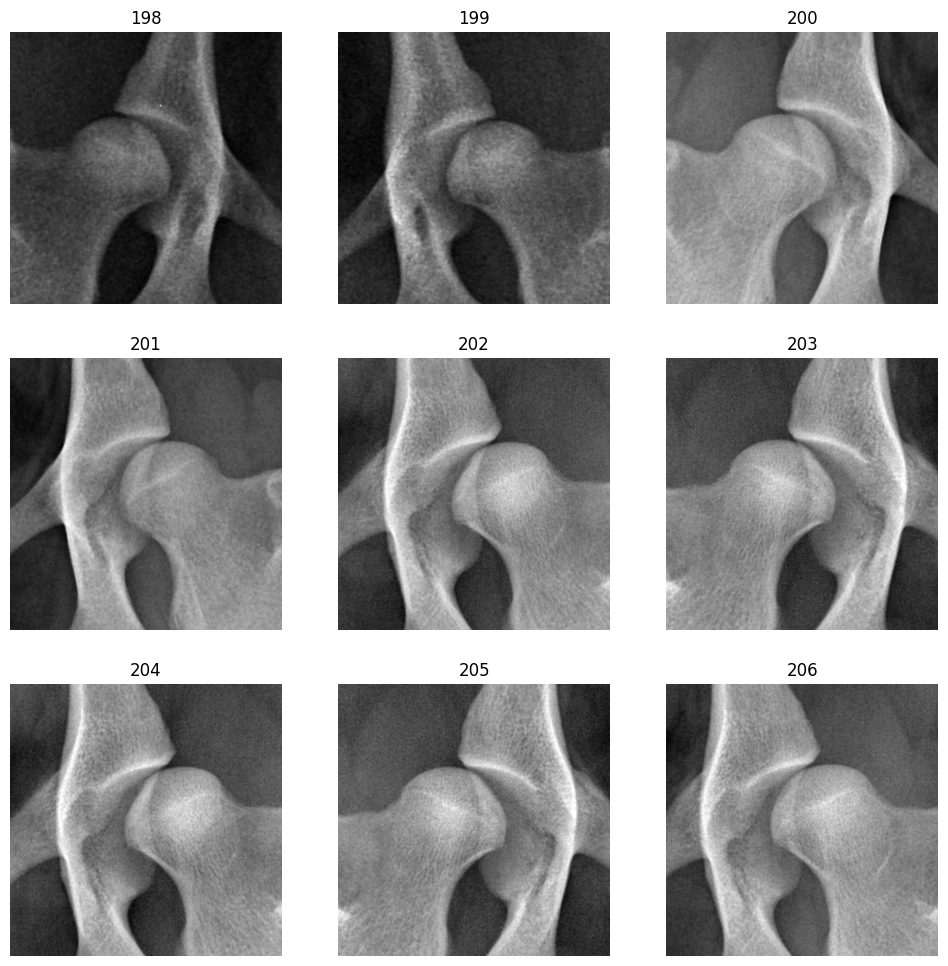

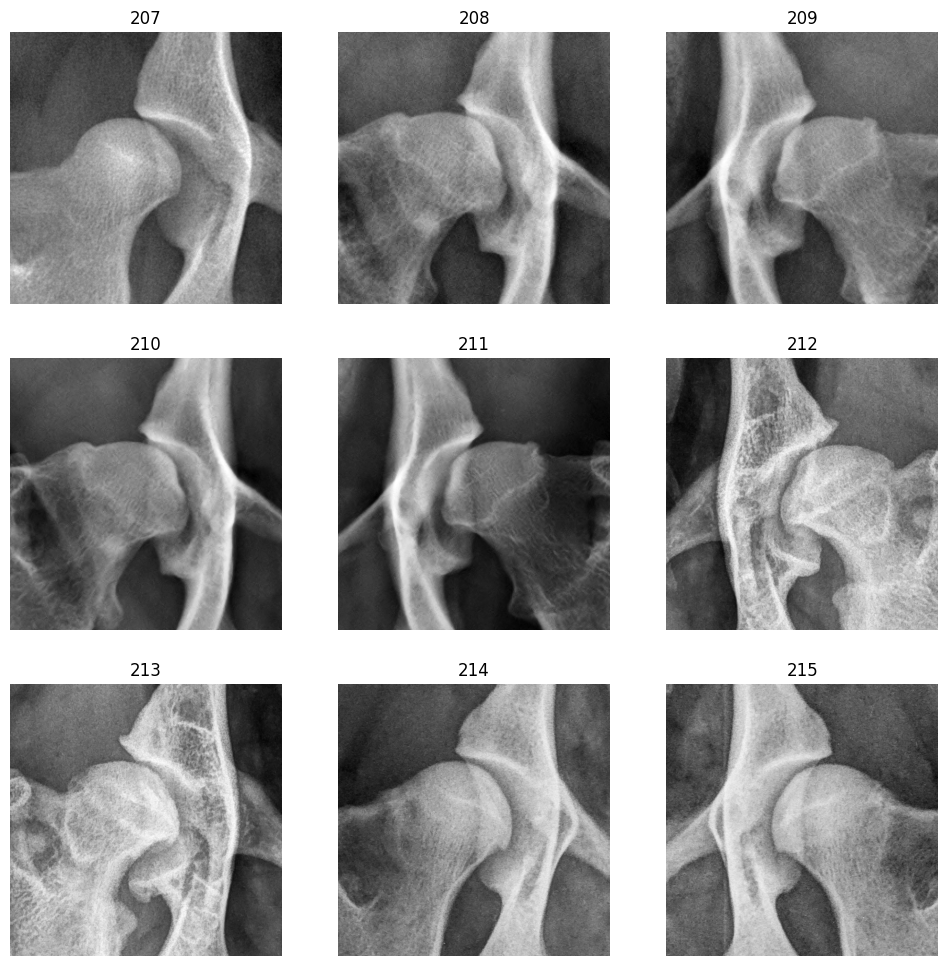

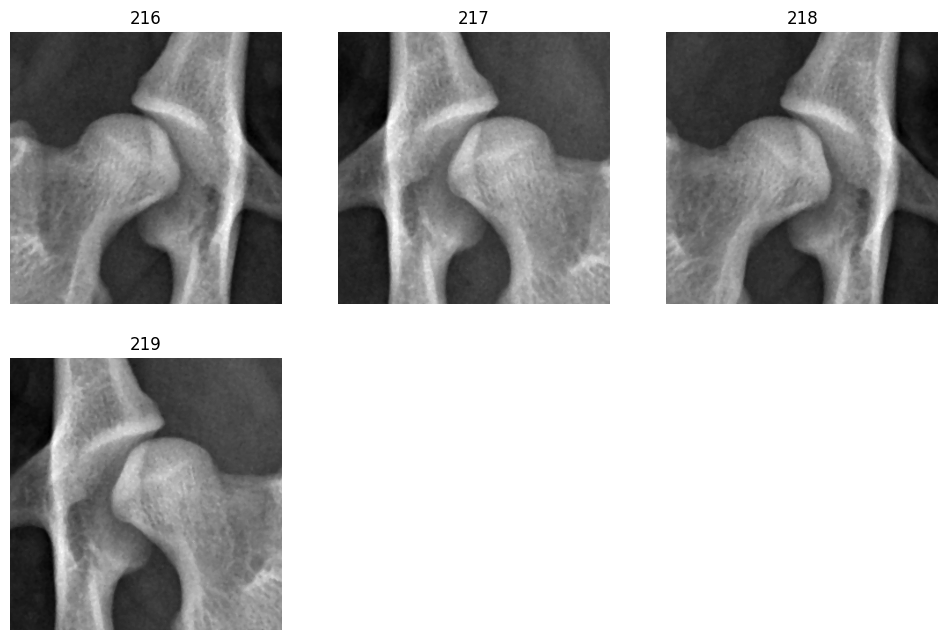

In [8]:
for id, item in detection_df.iterrows():
    fn = item['crop_name']
    img = np.load(os.path.join(saved_cropped_image,fn + '.npy'))
    suffix = ' (check direction)' if item['is_rotated'] else ''
#     parent = item['parent_name']
#     if not pd.isnull(parent):
#         img = np.load(os.path.join(saved_cropped_image, parent,fn + '.npy'))
#     else:
#         img = np.load(os.path.join(saved_cropped_image,fn + '.npy'))
    plt.subplot(3,3, (id%9) + 1)
    plt.imshow(img, 'gray')
    plt.axis('off')
    plt.title(str(id)+suffix)

    if (id%9) == 8:
        plt.show()                    
        
plt.show()

## Assign "flipped" column before removing failed predictions

In [9]:
flipped = np.array([False] * detection_df.shape[0])
flipped_indice = [186, 187]
flipped[detection_df.index.isin(flipped_indice)] = True
detection_df['flipped'] = flipped

## Remove bad detection items

In [10]:
remove_indice = [4, 5, 6, 7, 100, 101, 178, 179, 180, 181]
detection_df[~detection_df.index.isin(remove_indice)]

,base_path,filename,parent_name,crop_name,ax0_min,ax0_max,ax1_min,ax1_max,confidence,is_rotated,diagnosis,diagnosis_raw,flipped
0,P:/CoxaAI/Sortering 1/EE,1.3.51.0.7.11779273936.56926.37446.34587.43056...,1-22001308,1.3.51.0.7.11779273936.56926.37446.34587.43056...,2022,2190,1347,1482,0.783292,False,4,EE,False
1,P:/CoxaAI/Sortering 1/EE,1.3.51.0.7.11779273936.56926.37446.34587.43056...,1-22001308,1.3.51.0.7.11779273936.56926.37446.34587.43056...,2029,2184,2173,2299,0.697642,False,4,EE,False
2,P:/CoxaAI/Sortering 1/EE,1.2.276.0.95.31933.1.20220119.172502.0.2.20342...,1-22001845,1.2.276.0.95.31933.1.20220119.172502.0.2.20342...,588,760,797,922,0.913807,False,4,EE,False
3,P:/CoxaAI/Sortering 1/EE,1.2.276.0.95.31933.1.20220119.172502.0.2.20342...,1-22001845,1.2.276.0.95.31933.1.20220119.172502.0.2.20342...,591,771,1430,1568,0.831446,False,4,EE,False
8,P:/CoxaAI/Sortering 1/EE,1.2.392.200036.9125.4.0.3424719848.352342016.2...,1-22004708,1.2.392.200036.9125.4.0.3424719848.352342016.2...,828,955,606,699,0.973045,False,4,EE,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
215,P:/CoxaAI/Sortering 1/EE,1.3.51.0.7.12881292634.48832.29515.46691.11948...,1-23053563,1.3.51.0.7.12881292634.48832.29515.46691.11948...,998,1279,2310,2524,0.919089,False,4,EE,False
216,P:/CoxaAI/Sortering 1/EE,1.2.276.0.95.33458.1.20230616.84523.0.2.12239.dcm,1-23055006,1.2.276.0.95.33458.1.20230616.84523.0.2.12239....,1176,1311,1130,1233,0.995705,False,4,EE,False
217,P:/CoxaAI/Sortering 1/EE,1.2.276.0.95.33458.1.20230616.84523.0.2.12239.dcm,1-23055006,1.2.276.0.95.33458.1.20230616.84523.0.2.12239....,1207,1339,1713,1817,0.947854,False,4,EE,False
218,P:/CoxaAI/Sortering 1/EE,1.2.276.0.95.33458.1.20230616.84811.0.2.12242.dcm,1-23055006,1.2.276.0.95.33458.1.20230616.84811.0.2.12242....,1153,1292,1153,1254,0.978451,False,4,EE,False


In [11]:
new_detection_df = detection_df[~detection_df.index.isin(remove_indice)]

In [12]:
exclude_ids = pd.read_csv('exclude_id.csv').id.values
new_detection_df = new_detection_df[~new_detection_df.parent_name.isin(exclude_ids)]
print(new_detection_df.shape)

(210, 13)


In [13]:
new_detection_df.to_csv(filename_clean, index=False)

In [14]:
detection_df[detection_df.index.isin(remove_indice)]

,base_path,filename,parent_name,crop_name,ax0_min,ax0_max,ax1_min,ax1_max,confidence,is_rotated,diagnosis,diagnosis_raw,flipped
4,P:/CoxaAI/Sortering 1/EE,1.2.276.0.95.33739.20220223.145121.0.dcm,1-22002652,1.2.276.0.95.33739.20220223.145121.0.dcm_h1,588,760,797,922,0.0,True,4,EE,False
5,P:/CoxaAI/Sortering 1/EE,1.2.276.0.95.33739.20220223.145121.0.dcm,1-22002652,1.2.276.0.95.33739.20220223.145121.0.dcm_h2,591,771,1430,1568,0.0,True,4,EE,False
6,P:/CoxaAI/Sortering 1/EE,1.2.276.0.95.33739.20220223.145410.0.dcm,1-22002652,1.2.276.0.95.33739.20220223.145410.0.dcm_h1,588,760,797,922,0.0,True,4,EE,False
7,P:/CoxaAI/Sortering 1/EE,1.2.276.0.95.33739.20220223.145410.0.dcm,1-22002652,1.2.276.0.95.33739.20220223.145410.0.dcm_h2,591,771,1430,1568,0.0,True,4,EE,False
100,P:/CoxaAI/Sortering 1/EE,1.2.276.0.95.31653.1.20230303.134123.0.2.6514.dcm,1-23019630,1.2.276.0.95.31653.1.20230303.134123.0.2.6514....,733,874,790,894,0.0,True,4,EE,False
101,P:/CoxaAI/Sortering 1/EE,1.2.276.0.95.31653.1.20230303.134123.0.2.6514.dcm,1-23019630,1.2.276.0.95.31653.1.20230303.134123.0.2.6514....,721,859,1331,1430,0.0,True,4,EE,False
178,P:/CoxaAI/Sortering 1/EE,1.3.51.0.7.11700150785.37361.48453.33670.4857....,1-23039224,1.3.51.0.7.11700150785.37361.48453.33670.4857....,772,881,287,372,0.0,True,4,EE,False
179,P:/CoxaAI/Sortering 1/EE,1.3.51.0.7.11700150785.37361.48453.33670.4857....,1-23039224,1.3.51.0.7.11700150785.37361.48453.33670.4857....,776,889,733,820,0.0,True,4,EE,False
180,P:/CoxaAI/Sortering 1/EE,1.3.51.0.7.3552145443.36820.29763.42986.51255....,1-23039224,1.3.51.0.7.3552145443.36820.29763.42986.51255....,772,881,287,372,0.0,True,4,EE,False
181,P:/CoxaAI/Sortering 1/EE,1.3.51.0.7.3552145443.36820.29763.42986.51255....,1-23039224,1.3.51.0.7.3552145443.36820.29763.42986.51255....,776,889,733,820,0.0,True,4,EE,False


In [15]:
detection_df[detection_df.index.isin([182, 183, 208, 209, 210, 211, 212, 213])]

,base_path,filename,parent_name,crop_name,ax0_min,ax0_max,ax1_min,ax1_max,confidence,is_rotated,diagnosis,diagnosis_raw,flipped
182,P:/CoxaAI/Sortering 1/EE,1.3.51.0.7.1438650395.56947.13894.38785.22926....,1-23039778,1.3.51.0.7.1438650395.56947.13894.38785.22926....,797,1005,777,933,0.888859,False,4,EE,False
183,P:/CoxaAI/Sortering 1/EE,1.3.51.0.7.1438650395.56947.13894.38785.22926....,1-23039778,1.3.51.0.7.1438650395.56947.13894.38785.22926....,836,1040,1541,1697,0.872835,False,4,EE,False
208,P:/CoxaAI/Sortering 1/EE,1.2.392.200036.9125.4.0.1126468163.453026912.2...,1-23052417,1.2.392.200036.9125.4.0.1126468163.453026912.2...,1259,1367,615,695,0.823477,False,4,EE,False
209,P:/CoxaAI/Sortering 1/EE,1.2.392.200036.9125.4.0.1126468163.453026912.2...,1-23052417,1.2.392.200036.9125.4.0.1126468163.453026912.2...,1244,1354,1048,1130,0.789499,False,4,EE,False
210,P:/CoxaAI/Sortering 1/EE,1.2.392.200036.9125.4.0.1126473791.2399183968....,1-23052417,1.2.392.200036.9125.4.0.1126473791.2399183968....,1601,1703,633,716,0.682517,False,4,EE,False
211,P:/CoxaAI/Sortering 1/EE,1.2.392.200036.9125.4.0.1126473791.2399183968....,1-23052417,1.2.392.200036.9125.4.0.1126473791.2399183968....,1584,1698,1078,1164,0.395114,False,4,EE,False
212,P:/CoxaAI/Sortering 1/EE,1.3.51.0.7.1208784193.41386.6728.37337.50391.3...,1-23052425,1.3.51.0.7.1208784193.41386.6728.37337.50391.3...,1009,1211,1393,1552,0.895573,False,4,EE,False
213,P:/CoxaAI/Sortering 1/EE,1.3.51.0.7.1208784193.41386.6728.37337.50391.3...,1-23052425,1.3.51.0.7.1208784193.41386.6728.37337.50391.3...,1029,1247,631,788,0.819292,False,4,EE,False
